# Analyzing Urban Traffic Dynamics in New York City through Simulated Real-Time Data Streaming

### Name: Adam Sattout | Alper Mert
### ID: 2220765061 | 2200765029 
---

### Data Importing

In [1]:
import pandas as pd

path="Automated_Traffic_Volume_Counts_20251227.csv"
df=pd.read_csv(path)

C:\Users\adams\AppData\Local\Temp\ipykernel_14484\1603767674.py:4: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(path)


In [2]:
display(df.columns)
display(df.head())
display(df.info())

Index(['RequestID', 'Boro', 'Yr', 'M', 'D', 'HH', 'MM', 'Vol', 'SegmentID',
       'WktGeom', 'street', 'fromSt', 'toSt', 'Direction'],
      dtype='object')

,RequestID,Boro,Yr,M,D,HH,MM,Vol,SegmentID,WktGeom,street,fromSt,toSt,Direction
0,22562,Queens,2016,5,8,8,45,260,155613,POINT (1059678.8154876027 198480.09766927382),HEMPSTEAD AVENUE,Cross Island Parkway,Cross Is Pkwy Nb En Hempstead Wb,WB
1,22562,Queens,2016,5,8,9,0,243,155613,POINT (1059678.8154876027 198480.09766927382),HEMPSTEAD AVENUE,Cross Island Parkway,Cross Is Pkwy Nb En Hempstead Wb,WB
2,22562,Queens,2016,5,8,9,15,245,155613,POINT (1059678.8154876027 198480.09766927382),HEMPSTEAD AVENUE,Cross Island Parkway,Cross Is Pkwy Nb En Hempstead Wb,WB
3,22562,Queens,2016,5,8,9,30,304,155613,POINT (1059678.8154876027 198480.09766927382),HEMPSTEAD AVENUE,Cross Island Parkway,Cross Is Pkwy Nb En Hempstead Wb,WB
4,22562,Queens,2016,5,8,9,45,312,155613,POINT (1059678.8154876027 198480.09766927382),HEMPSTEAD AVENUE,Cross Island Parkway,Cross Is Pkwy Nb En Hempstead Wb,WB


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1838386 entries, 0 to 1838385
Data columns (total 14 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   RequestID  int64 
 1   Boro       object
 2   Yr         int64 
 3   M          int64 
 4   D          int64 
 5   HH         int64 
 6   MM         int64 
 7   Vol        object
 8   SegmentID  int64 
 9   WktGeom    object
 10  street     object
 11  fromSt     object
 12  toSt       object
 13  Direction  object
dtypes: int64(7), object(7)
memory usage: 196.4+ MB


None

---

## Data Processing

In [3]:
# 1) Missing values check
missing_counts = df.isna().sum()
missing_nonzero = missing_counts[missing_counts > 0].sort_values(ascending=False)

print("Total missing values in dataset:", int(missing_counts.sum()))
print("Number of columns with missing values:", int((missing_counts > 0).sum()))
if len(missing_nonzero) > 0:
    display(pd.DataFrame({
        "missing_count": missing_nonzero,
        "missing_pct": (missing_nonzero / len(df) * 100).round(3)
    }))

Total missing values in dataset: 1246
Number of columns with missing values: 1


,missing_count,missing_pct
toSt,1246,0.068


In [4]:
df[df["toSt"].isna()]["RequestID"].value_counts()

RequestID
10877    1142
10878     104
Name: count, dtype: int64

It looks like these missing values are produced from only 2 requests.. so it seems safe to assume they are accidental errors and remove them

In [5]:
df = df.dropna(subset=["toSt"])

In [6]:
s = df['Vol'].astype(str).str.replace(',', '', regex=False).str.replace(' ', '', regex=False)
df['Vol'] = pd.to_numeric(s, errors='coerce')

num_cols = ["Vol"]
print("Numeric columns:", len(num_cols))

def iqr_outlier_count(s: pd.Series) -> int:
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1
    if iqr == 0:
        return 0
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    return int(((s < low) | (s > high)).sum())

# IQR outliers per feature
iqr_counts = pd.Series({c: iqr_outlier_count(df[c]) for c in num_cols}).sort_values(ascending=False)
iqr_nonzero = iqr_counts[iqr_counts > 0]

print("Columns with IQR outliers:", int(len(iqr_nonzero)), "/", len(num_cols))
display(pd.DataFrame({
    "iqr_outlier_count": iqr_nonzero,
    "iqr_outlier_pct": (iqr_nonzero / len(df) * 100).round(3)
}).head(15))

Numeric columns: 1
Columns with IQR outliers: 1 / 1


,iqr_outlier_count,iqr_outlier_pct
Vol,132511,7.213


In [7]:
df['timestamp'] = pd.to_datetime(
    df[['Yr','M','D','HH','MM']]
    .rename(columns={'Yr':'year', 'M':'month', 'D':'day', 'HH':'hour', 'MM':'minute'})
)

df['weekday'] = df['timestamp'].dt.dayofweek

In [8]:
df = df.sort_values('timestamp').reset_index(drop=True)

In [9]:
df.head()

,RequestID,Boro,Yr,M,D,HH,MM,Vol,SegmentID,WktGeom,street,fromSt,toSt,Direction,timestamp,weekday
0,2276,Manhattan,2000,1,1,0,15,231,32956,POINT (986884.7 207042.2),W/B UNION SQUARE E @ E 14 ST,E 14 ST/BROADWAY,4 AV,WB,2000-01-01 00:15:00,5
1,2276,Manhattan,2000,1,1,0,30,238,32956,POINT (986884.7 207042.2),W/B UNION SQUARE E @ E 14 ST,E 14 ST/BROADWAY,4 AV,WB,2000-01-01 00:30:00,5
2,7513,Staten Island,2000,1,1,0,30,124,138673,POINT (962968.1 158490),N/B STEUBEN ST @ WINDERMERE RD,WINDERMERE RD,W FINGERBOARD RD,NB,2000-01-01 00:30:00,5
3,2276,Manhattan,2000,1,1,0,45,249,32956,POINT (986884.7 207042.2),W/B UNION SQUARE E @ E 14 ST,E 14 ST/BROADWAY,4 AV,WB,2000-01-01 00:45:00,5
4,7513,Staten Island,2000,1,1,0,45,120,138673,POINT (962968.1 158490),N/B STEUBEN ST @ WINDERMERE RD,WINDERMERE RD,W FINGERBOARD RD,NB,2000-01-01 00:45:00,5


In [10]:
df.columns

Index(['RequestID', 'Boro', 'Yr', 'M', 'D', 'HH', 'MM', 'Vol', 'SegmentID',
       'WktGeom', 'street', 'fromSt', 'toSt', 'Direction', 'timestamp',
       'weekday'],
      dtype='object')

---

## Visualizations

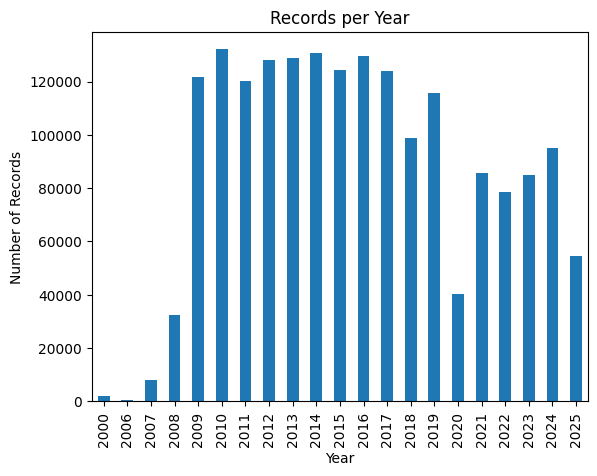

In [11]:
import matplotlib.pyplot as plt

counts_per_year = df["Yr"].value_counts().sort_index()

counts_per_year.plot(kind="bar")
plt.xlabel("Year")
plt.ylabel("Number of Records")
plt.title("Records per Year")
plt.show()

The data seems to have huge gaps in years like 2000-2006 and on 2020. Which may make it less representing to these times

<Axes: ylabel='Vol'>

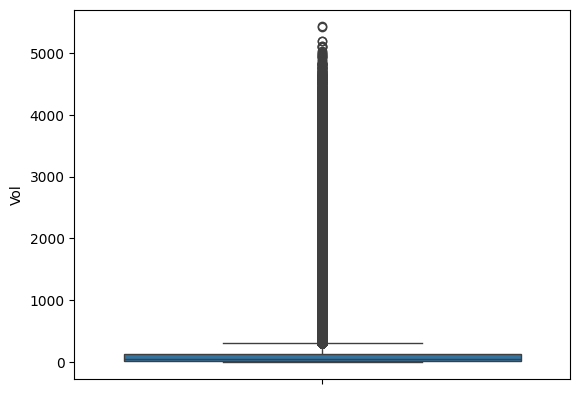

In [12]:
import seaborn as sns
sns.boxplot(df['Vol'])

<Axes: title={'center': 'Avg Volume by Hour'}, xlabel='HH'>

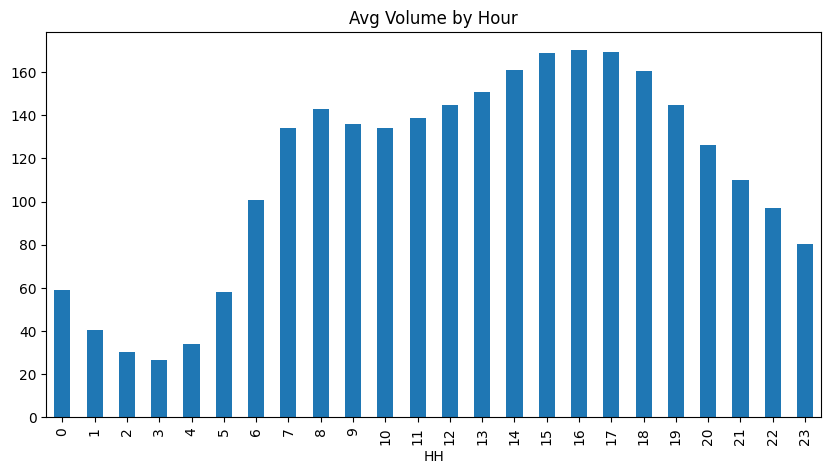

In [13]:
df.groupby('HH')['Vol'].mean().plot(kind='bar', figsize=(10,5), title="Avg Volume by Hour")


<Axes: xlabel='weekday'>

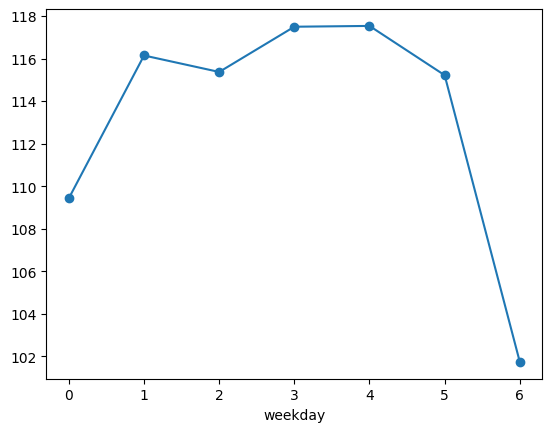

In [14]:
df.groupby('weekday')['Vol'].mean().plot(kind='line', marker='o')

<Axes: xlabel='timestamp'>

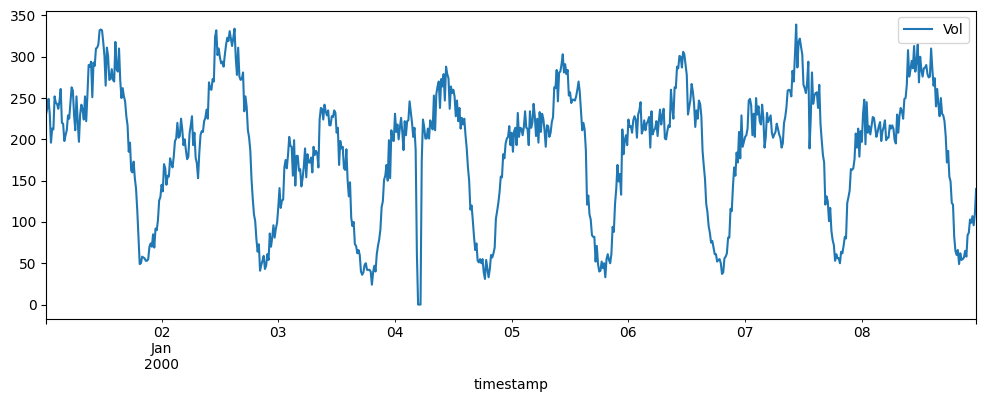

In [15]:
example_seg = df[df['SegmentID'] == df['SegmentID'].iloc[0]]
example_seg.plot(x='timestamp', y='Vol', figsize=(12,4))

---

## Biggest Events

In [16]:
import numpy as np
import pandas as pd
import datetime as dt

df["date"] = df["timestamp"].dt.date

keys = ["SegmentID","weekday","HH","MM"]

expected = (df.groupby(keys)["Vol"].median()
              .rename("expected").reset_index())

df_merged = df.merge(expected, on=keys, how="left")

alpha = 5  # small stabilizer so expected=0 doesn’t break things (tune)
df_merged["uplift"] = (df_merged["Vol"] - df_merged["expected"]) / (df_merged["expected"] + alpha)
df_merged["ratio"]  = df_merged["Vol"] / (df_merged["expected"] + alpha)

# Avoid “fake shocks” when expected is tiny
df_valid = df_merged[df_merged["expected"] >= 20].copy()

thr = df_valid["uplift"].quantile(0.999)  # top 0.1%
events = (df_valid[df_valid["uplift"] >= thr]
          .sort_values("uplift", ascending=False))

# See biggest spike events (day+street)
events[["date","SegmentID","Vol","expected","uplift","ratio","Boro","Direction"]].head(50)

,date,SegmentID,Vol,expected,uplift,ratio,Boro,Direction
601341,2013-05-31,141152,1104,23.5,37.912281,38.736842,Bronx,NB
598653,2013-05-24,141152,1104,23.5,37.912281,38.736842,Bronx,NB
1474048,2021-05-27,192731,1334,33.0,34.236842,35.105263,Queens,WB
1473666,2021-05-26,192731,1334,33.0,34.236842,35.105263,Queens,WB
1473283,2021-05-25,192731,1326,33.0,34.026316,34.894737,Queens,WB
1473669,2021-05-26,192731,1689,44.0,33.571429,34.469388,Queens,WB
601327,2013-05-31,141152,889,21.0,33.384615,34.192308,Bronx,NB
1346469,2019-06-30,192731,1129,28.0,33.363636,34.212121,Queens,WB
1346459,2019-06-30,192731,987,24.0,33.206897,34.034483,Queens,WB
598638,2013-05-24,141152,879,21.0,33.000000,33.807692,Bronx,NB


In [17]:
events.head(1000)["date"].value_counts().head(10)

date
2021-05-26    74
2021-05-27    73
2021-05-25    73
2019-06-30    72
2019-04-27    42
2019-05-04    40
2019-04-28    37
2019-05-05    35
2019-04-29    33
2019-05-06    33
Name: count, dtype: int64

In [18]:
events[events["Yr"] == 2024].head(1000)["date"].value_counts().head(10)

date
2024-06-23    6
2024-04-08    2
2024-04-03    2
2024-04-10    2
2024-04-12    2
2024-04-02    2
2024-10-20    2
2024-04-01    1
2024-04-05    1
2024-04-09    1
Name: count, dtype: int64

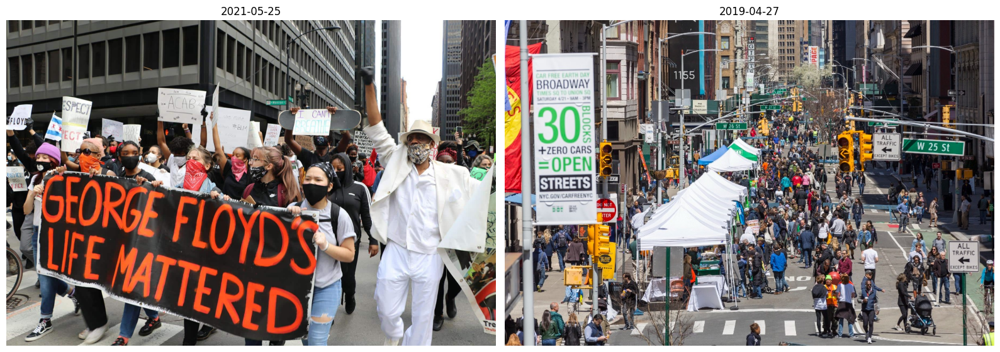

In [71]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img1 = mpimg.imread("ge.jpeg")
img2 = mpimg.imread("carfree.jpg")

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(img1); axes[0].axis("off"); axes[0].set_title("2021-05-25")
axes[1].imshow(img2); axes[1].axis("off"); axes[1].set_title("2019-04-27")
plt.tight_layout()
plt.show()


---

## Trend Analysis

In [20]:
daily = (
    df
    .set_index('timestamp')
    .resample('D')['Vol']
    .mean()
)

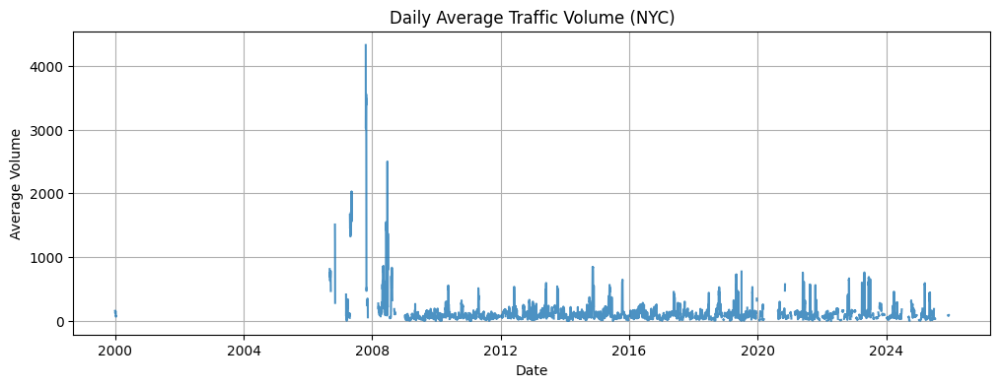

In [21]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))
plt.plot(daily, alpha=0.8)
plt.title("Daily Average Traffic Volume (NYC)")
plt.xlabel("Date")
plt.ylabel("Average Volume")
plt.grid(True)
plt.show()


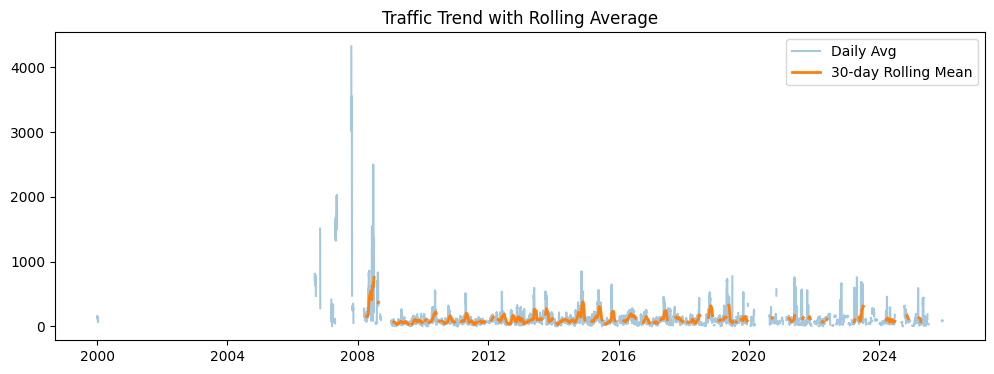

In [22]:
rolling_30 = daily.rolling(window=30).mean() ##rolling trend(smoothed) for balanced visualization
plt.figure(figsize=(12,4))
plt.plot(daily, label='Daily Avg', alpha=0.4)
plt.plot(rolling_30, label='30-day Rolling Mean', linewidth=2)
plt.legend()
plt.title("Traffic Trend with Rolling Average")
plt.show()


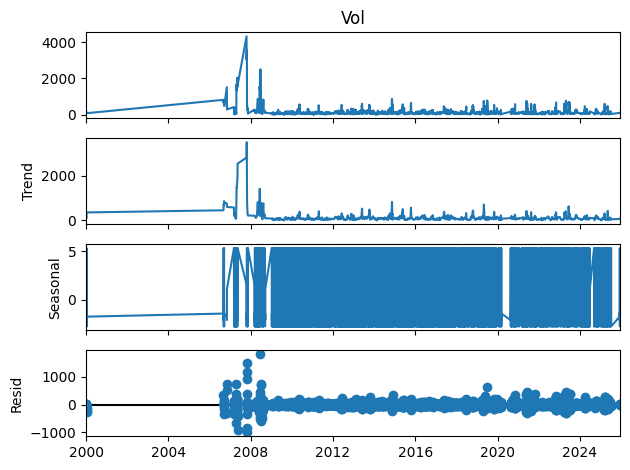

In [23]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomp = seasonal_decompose(daily.dropna(), model='additive', period=7)
decomp.plot()
plt.show()


The figure shows the seasonal decomposition of the daily average traffic volume time series using an additive model with a weekly period (7 days).

Observed(Vol): The original traffic volume series exhibits high variability and frequent spikes, indicating strong short-term fluctuations in traffic flow. These variations reflect daily traffic dynamics influenced by location, time of day, and measurement conditions.

Trend: The trend component captures the long-term evolution of traffic volume over time. After smoothing out short-term fluctuations, the trend appears relatively stable with intermittent peaks, suggesting no strong monotonic increase or decrease in overall traffic volume, but rather recurring periods of elevated activity.

Seasonal: The seasonal component represents weekly periodic patterns. It reflects systematic differences between weekdays and weekends, where traffic volumes tend to repeat similar patterns every week. The relatively small amplitude of this component indicates that weekly seasonality contributes less to overall variability than short-term fluctuations or anomalies.

Residual: The residual component contains irregular variations that are not explained by trend or seasonality. Several large residual values are visible, which may correspond to unexpected traffic surges, sensor noise, or external events such as accidents or road closures.

As sumarry, this decomposition reveals that NYC traffic volume is primarily driven by short-term fluctuations and localized events, while weekly seasonality plays a secondary but consistent role in shaping traffic behavior.

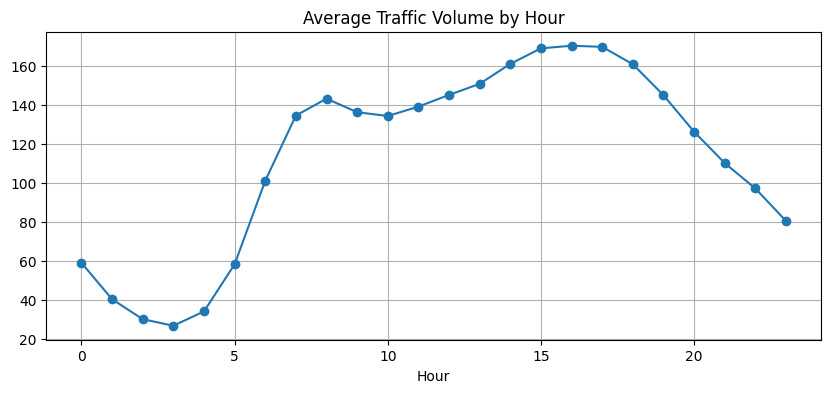

In [24]:
#intraday (short-term hourly trend)
df['Hour'] = df['timestamp'].dt.hour
hourly_mean = df.groupby('Hour')['Vol'].mean()
hourly_mean.plot(
    kind='line',
    marker='o',
    figsize=(10,4),
    title="Average Traffic Volume by Hour"
)
plt.grid(True)
plt.show()


The plot illustrates the average traffic volume across different hours of the day in New York City.

The results reveal a clear intraday traffic pattern. Traffic volume is lowest during the late-night and early-morning hours (approximately 01:00–04:00), reflecting reduced mobility during nighttime. Starting from early morning, traffic volume increases sharply and reaches a morning peak around 07:00–09:00, corresponding to daily commuting hours. After a slight stabilization during mid-day, traffic volume rises again and reaches its highest levels in the late afternoon and early evening (approximately 15:00–17:00), indicating the evening rush hour. Following this peak, traffic volume gradually decreases toward the night hours.

Overall, this analysis confirms the presence of strong and consistent daily traffic cycles driven by human activity and commuting behavior, highlighting the importance of time-of-day as a key factor in traffic dynamics.

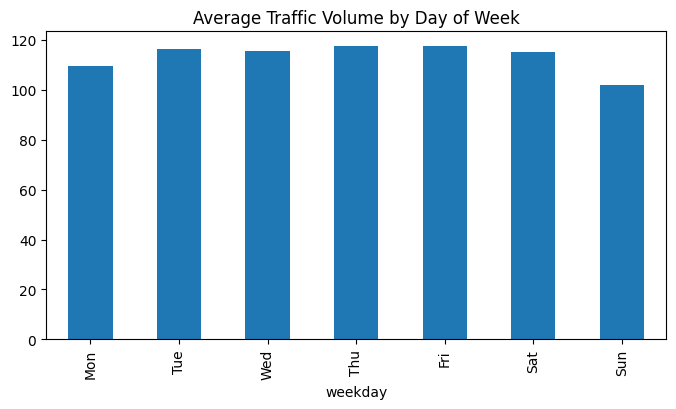

In [25]:
##weekly trend
df['weekday'] = df['timestamp'].dt.dayofweek
weekly = df.groupby('weekday')['Vol'].mean()
weekly.plot(
    kind='bar',
    figsize=(8,4),
    title="Average Traffic Volume by Day of Week"
)
plt.xticks(range(7), ['Mon','Tue','Wed','Thu','Fri','Sat','Sun'])
plt.show()


The plot presents the average traffic volume by day of the week in New York City.

The results indicate a clear weekday–weekend pattern in traffic behavior. Traffic volume remains relatively high and stable from Monday through Friday, with a gradual increase toward the end of the workweek. The highest average traffic volume is observed on Friday, which may reflect combined effects of regular commuting and additional leisure-related travel. On Saturday, traffic volume slightly decreases compared to weekdays but remains relatively high, suggesting continued urban mobility. In contrast, Sunday exhibits the lowest average traffic volume, consistent with reduced commuting activity and limited commercial operations.

Overall, this analysis highlights the strong influence of weekly routines on traffic dynamics, emphasizing the distinction between weekday commuting patterns and weekend travel behavior.

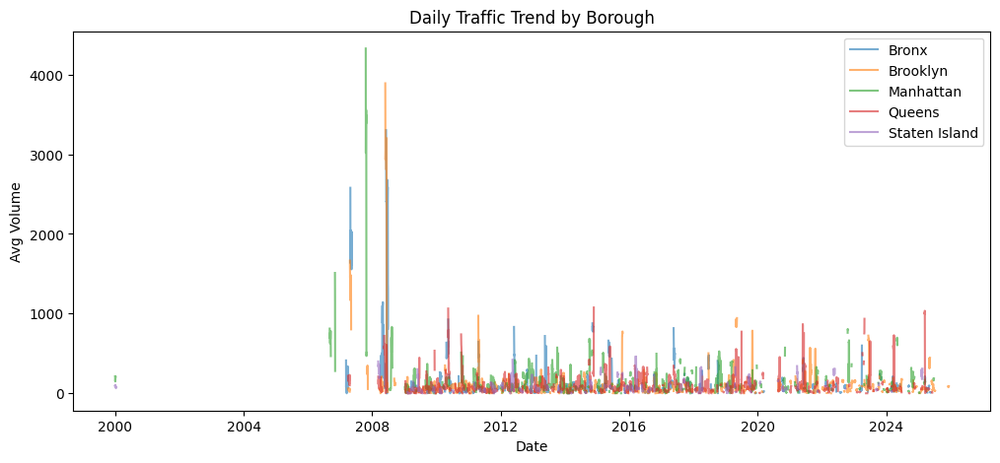

In [26]:
##borough/place trend
boro_daily = (
    df
    .set_index('timestamp')
    .groupby('Boro')
    .resample('D')['Vol']
    .mean()
    .reset_index()
)
plt.figure(figsize=(12,5))
for boro in boro_daily['Boro'].unique():
    subset = boro_daily[boro_daily['Boro'] == boro]
    plt.plot(subset['timestamp'], subset['Vol'], label=boro, alpha=0.6)
plt.legend()
plt.title("Daily Traffic Trend by Borough")
plt.xlabel("Date")
plt.ylabel("Avg Volume")
plt.show()


The plot illustrates the daily average traffic volume trends across the five boroughs of New York City.

While all boroughs exhibit frequent short-term fluctuations and sharp spikes, the overall magnitude and volatility of traffic volume differ across locations. The presence of numerous sharp peaks indicates localized or short-term factors such as special events, road works, or sensor-specific conditions. Despite the high level of noise, the plot demonstrates that traffic dynamics are highly location-dependent and cannot be adequately described using a single aggregated trend.

This analysis underscores the importance of incorporating spatial context when modeling urban traffic patterns, as borough-level differences contribute significantly to overall traffic behavior.

In [27]:
df['weekday'] = df['timestamp'].dt.dayofweek
df['is_weekend'] = df['weekday'].isin([5, 6]).astype(int)

In [28]:
segment_profile = (
    df
    .groupby('SegmentID')
    .agg(
        mean_vol=('Vol', 'mean'),
        std_vol=('Vol', 'std'),
        max_vol=('Vol', 'max'),
        median_vol=('Vol', 'median'),

        morning_ratio=('HH', lambda x: ((x >= 7) & (x <= 9)).mean()),
        evening_ratio=('HH', lambda x: ((x >= 16) & (x <= 18)).mean()),
        weekend_ratio=('is_weekend', 'mean'),

        n_obs=('Vol', 'count')
    )
    .dropna()
)

In [29]:
segment_profile.head()


,mean_vol,std_vol,max_vol,median_vol,morning_ratio,evening_ratio,weekend_ratio,n_obs
SegmentID,,,,,,,,
44,272.684437,124.267469,526,296.0,0.129837,0.123818,0.474635,1163
138,132.054450,104.768391,481,121.0,0.123829,0.126464,0.281030,3416
139,55.211806,35.918172,166,54.0,0.125000,0.125000,0.333333,576
724,52.266667,21.509057,147,52.5,0.066667,0.200000,0.000000,60
1712,43.511482,30.837857,155,45.0,0.123173,0.125261,0.240501,2395


In [30]:
#the segments with highest traffic
segment_profile.sort_values('mean_vol', ascending=False).head(10)


,mean_vol,std_vol,max_vol,median_vol,morning_ratio,evening_ratio,weekend_ratio,n_obs
SegmentID,,,,,,,,
154271,3013.947020,1398.060993,4924,3502.0,0.125828,0.125828,0.317881,453
36524,2700.284404,1778.414875,5425,3207.0,0.133028,0.123853,0.403670,218
135187,2260.244552,1159.959547,4189,2470.0,0.128329,0.123487,0.329298,413
154468,1928.252604,1121.307378,4669,2001.0,0.125000,0.125000,0.348958,384
135125,1524.819444,1381.419602,4941,1310.5,0.125000,0.125000,0.333333,432
142782,1202.500000,17.677670,1215,1202.5,1.000000,0.000000,0.000000,2
33980,1183.000000,476.799953,1881,1363.5,0.071429,0.142857,0.880952,42
140134,1161.239583,529.771386,1885,1379.5,0.125000,0.125000,0.000000,96
9012150,1073.627368,373.877417,1650,1215.0,0.126316,0.124211,0.000000,475


In [31]:
#the most volatile roads
segment_profile.sort_values('std_vol', ascending=False).head(10)


,mean_vol,std_vol,max_vol,median_vol,morning_ratio,evening_ratio,weekend_ratio,n_obs
SegmentID,,,,,,,,
36524,2700.284404,1778.414875,5425,3207.0,0.133028,0.123853,0.403670,218
154271,3013.947020,1398.060993,4924,3502.0,0.125828,0.125828,0.317881,453
135125,1524.819444,1381.419602,4941,1310.5,0.125000,0.125000,0.333333,432
135187,2260.244552,1159.959547,4189,2470.0,0.128329,0.123487,0.329298,413
154468,1928.252604,1121.307378,4669,2001.0,0.125000,0.125000,0.348958,384
95879,978.632337,868.963360,4418,835.5,0.119530,0.124867,0.338847,1874
141152,626.387612,780.474839,4487,490.0,0.124542,0.126873,0.330003,3003
141367,960.383628,724.524982,2839,610.0,0.123596,0.125201,0.154093,623
141368,867.619565,722.616131,2993,568.0,0.125000,0.125000,0.086957,552


In [32]:
##the roads on morning
segment_profile.sort_values('morning_ratio', ascending=False).head(10)


,mean_vol,std_vol,max_vol,median_vol,morning_ratio,evening_ratio,weekend_ratio,n_obs
SegmentID,,,,,,,,
96617,33.300000,14.384019,51,33.0,1.0,0.0,0.0,10
29296,183.500000,26.162951,202,183.5,1.0,0.0,0.0,2
35207,135.909091,21.965676,172,143.0,1.0,0.0,0.0,11
29299,108.000000,13.316656,119,112.0,1.0,0.0,0.0,4
29335,14.000000,2.645751,16,15.0,1.0,0.0,0.0,3
35135,82.800000,10.281051,94,85.0,1.0,0.0,0.0,5
159237,182.666667,23.115651,197,195.0,1.0,0.0,0.0,3
35133,111.666667,10.211105,123,111.0,1.0,0.0,0.0,6
132520,108.333333,30.435725,132,119.0,1.0,0.0,0.0,3


In [33]:
##the roads on evening
segment_profile.sort_values('evening_ratio', ascending=False).head(10)


,mean_vol,std_vol,max_vol,median_vol,morning_ratio,evening_ratio,weekend_ratio,n_obs
SegmentID,,,,,,,,
78763,20.000000,8.485281,26,20.0,0.0,1.0,1.0,2
71729,31.500000,21.215923,59,22.5,0.0,1.0,0.0,14
78748,50.500000,3.535534,53,50.5,0.0,1.0,1.0,2
72547,10.166667,5.269409,16,10.0,0.0,1.0,0.0,6
46589,70.600000,12.074767,88,68.0,0.0,1.0,0.0,5
38841,81.000000,9.899495,88,81.0,0.0,1.0,1.0,2
72554,18.333333,2.732520,21,19.5,0.0,1.0,0.0,6
33196,75.500000,21.920310,91,75.5,0.0,1.0,0.0,2
78761,16.500000,7.778175,22,16.5,0.0,1.0,1.0,2


To extract location-specific insights, street segment profiling was performed using aggregated traffic statistics.  For each road segment, summary features such as average traffic volume, variability, and peak-hour activity ratios were computed. The results reveal substantial heterogeneity across road segments, indicating the presence of functionally distinct road types, including consistently high-traffic arteries, morning-commute dominant segments, and highly volatile locations.


---

## Clustering

In [34]:
features = [
    'mean_vol',
    'std_vol',
    'morning_ratio',
    'evening_ratio',
    'weekend_ratio'
]

X = segment_profile[features]

In [35]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

All features were standardized prior to clustering to prevent scale dominance.

In [36]:
from sklearn.cluster import KMeans

In [37]:
kmeans=KMeans(n_clusters=4, random_state=42)
segment_profile['cluster']=kmeans.fit_predict(X_scaled)

In [38]:
from sklearn.metrics import silhouette_score
silhouette_score = silhouette_score(X_scaled, segment_profile['cluster'])
print("Silhouette Score (k=3):", silhouette_score)

Silhouette Score (k=3): 0.3788016626464776


We first tried with cluster number as 3 and its silhouette score is better than this one(0.52). However, to gain insight information and get more meaningful and separable clusters 4 cluster number is better, so we will use k as 4 even it's lower silhouette score.

In [39]:
cluster_summary=(segment_profile.groupby('cluster')[features].mean())
cluster_summary

,mean_vol,std_vol,morning_ratio,evening_ratio,weekend_ratio
cluster,,,,,
0,82.452058,40.259810,0.126696,0.129888,0.634420
1,83.654461,17.897698,0.900325,0.000000,0.113516
2,705.348488,358.797874,0.134113,0.122893,0.252643
3,80.649386,42.206817,0.112099,0.116277,0.139380


Cluster 0: low traffic volume, morning and evening ratios are close, weekend ratio is very low and kinda stable.

Cluster 1: high traffic volume during the whole day, deviation is very high, probably the main roads.

Cluster 2: morning traffic is very high and there is no evening traffic, weekend ratio is low.

Cluster 3: volume is not too high, morning and evening ratios are close, weekend ratio is very high.

According to this cluster informations, cluster 0 may be Low-Traffic Weekday Local Roads, cluster 1 may be High-Volume Major Arterials, cluster 2 may be Morning Commute-Dominated Roads and cluster 3 may be Weekend-Oriented Leisure Roads.

In [40]:
cluster_labels = {
    0: "Low-Traffic Weekday Local Roads",
    1: "High-Volume Major Arterials",
    2: "Morning Commute-Dominated Roads",
    3: "Weekend-Oriented Leisure Roads"
}

In [41]:
segment_profile['cluster_label'] = segment_profile['cluster'].map(cluster_labels)

In [42]:
segment_geom=(df[['SegmentID', 'WktGeom']].drop_duplicates().merge(segment_profile[['cluster_label']],on='SegmentID',how='inner'))

In [43]:
import geopandas as gpd
from shapely import wkt

segment_geom['geometry'] = segment_geom['WktGeom'].apply(wkt.loads)
gdf=gpd.GeoDataFrame(segment_geom,geometry='geometry',crs="EPSG:4326")

In [44]:
cluster_colors = {
    "Low-Traffic Weekday Local Roads": "blue",
    "High-Volume Major Arterials": "red",
    "Morning Commute-Dominated Roads": "orange",
    "Weekend-Oriented Leisure Roads": "green"
}

In [45]:
import folium
#NYC
m=folium.Map(location=[40.7128, -74.0060], zoom_start=11)
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, color=cluster_colors[row['cluster_label']]: {
            'color': color,
            'weight': 2,
            'opacity': 0.7
        },
        tooltip=row['cluster_label']
    ).add_to(m)

m

Cannot solve the trust notebook issue, instead save the map into html

In [46]:
m.save("cluster_map.html")
print("Saved: cluster_map.html")

Saved: cluster_map.html


---

## Predictive Modelling

In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score


feature_set=['HH','weekday','is_weekend', 'SegmentID']
target='Vol'

X = df[feature_set]
y = df[target]

X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [49]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [50]:
pred = model.predict(X_test)
print("Mean Absolute Error:", mean_absolute_error(y_test, pred))
print("R2:", r2_score(y_test, pred))

Mean Absolute Error: 23.9949774866398
R2: 0.8446217585381366


In [51]:
importance = pd.Series(
    model.feature_importances_,
    index=feature_set
).sort_values(ascending=False)

importance

SegmentID     0.822137
HH            0.136952
weekday       0.033191
is_weekend    0.007720
dtype: float64

In [53]:
df['is_morning_peak'] = df['HH'].between(7, 9).astype(int)
df['is_evening_peak'] = df['HH'].between(16, 18).astype(int)

In [54]:
segment_profile_reset = segment_profile.reset_index()

In [55]:
df = df.merge(
    segment_profile_reset[['SegmentID', 'cluster_label']],
    on='SegmentID',
    how='inner'
)


In [56]:
df[['SegmentID', 'cluster_label']].head()


,SegmentID,cluster_label
0,32956,Weekend-Oriented Leisure Roads
1,32956,Weekend-Oriented Leisure Roads
2,138673,Weekend-Oriented Leisure Roads
3,32956,Weekend-Oriented Leisure Roads
4,138673,Weekend-Oriented Leisure Roads


In [57]:
df['cluster'] = df['cluster_label'].astype('category').cat.codes

advanced_features = [
    'HH', 'weekday', 'is_weekend',
    'is_morning_peak', 'is_evening_peak',
    'cluster'
]

X = df[advanced_features]
y = df[target]

X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=42)


In [58]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [59]:
pred = model.predict(X_test)
print("Mean Absolute Error:", mean_absolute_error(y_test, pred))
print("R2:", r2_score(y_test, pred))

Mean Absolute Error: 71.03339570416392
R2: 0.5099920828532438


In [60]:
importance = pd.Series(
    model.feature_importances_,
    index=advanced_features
).sort_values(ascending=False)

importance

cluster            0.754712
HH                 0.227182
weekday            0.009963
is_weekend         0.003985
is_morning_peak    0.002170
is_evening_peak    0.001987
dtype: float64

In [61]:
from sklearn.ensemble import HistGradientBoostingRegressor

model = HistGradientBoostingRegressor(
    max_depth=6,
    learning_rate=0.05,
    max_iter=200,
    random_state=42
)

model.fit(X_train, y_train)

HistGradientBoostingRegressor(learning_rate=0.05, max_depth=6, max_iter=200,
                              random_state=42)

In [62]:
pred = model.predict(X_test)
print("Mean Absolute Error:", mean_absolute_error(y_test, pred))
print("R2:", r2_score(y_test, pred))

Mean Absolute Error: 71.04463314098936
R2: 0.5102307797150725


---

## Time Series

In [63]:
ts = (
    df
    .set_index('timestamp')
    .resample('H')['Vol']
    .sum()
)


C:\Users\adams\AppData\Local\Temp\ipykernel_14484\556736301.py:4: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample('H')['Vol']


<Axes: title={'center': 'City-level Hourly Traffic Volume'}, xlabel='timestamp'>

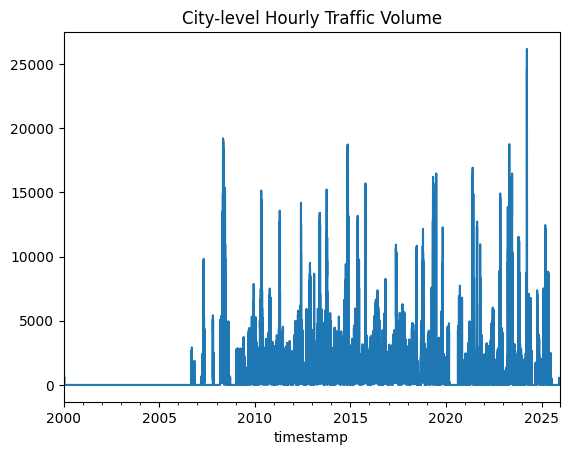

In [64]:
ts.plot(title='City-level Hourly Traffic Volume')


In [65]:
train = ts.iloc[:-24]
test  = ts.iloc[-24:]


In [66]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(train, order=(2,1,2))
fit = model.fit()
forecast = fit.forecast(steps=len(test))


In [67]:
mae = mean_absolute_error(test, forecast)
mae

124.54320227704359

In [68]:
from xgboost import XGBRegressor

X=df[advanced_features]
y=df['Vol']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = XGBRegressor(
    n_estimators=400,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=1,
    reg_lambda=1,
    random_state=42
)

In [69]:
model.fit(X_train, y_train)
pred = model.predict(X_test)

In [70]:
print("Mean Absolute Error:", mean_absolute_error(y_test, pred))
print("R2:", r2_score(y_test, pred))


Mean Absolute Error: 71.02051821862446
R2: 0.5104775428771973


As we can see, time series didnt give good results, so they were discarded from the report.